In [1]:
# Importo las librerías necesarias
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



**Corte de tejido:** Imagen representativa de cómo se consiguen las muestras.

Se toman láminas de un tejido y se ponen sobre una placa que contiene oligonucleótidos marcados y separados por spots (spots viene del inglés y se refiere a puntos específicos, osea, tengo varias áreas delimitadas en ese espacio 2d del corte del tejido), esos códigos de barrra (o marcaje) se hibridan con el ARNm que se liberará de las células, así podemos analizar qué se expresa, en qué cantidad y la posición del tejido donde se expresa. No sólo se hace con spots, algunas tecnologías permiten trabajar con células individuales.

Al final obtenemos para cada spot o cada celula:
Coordenadas espaciales, perfil de expresión de genes y la posibilidad de mapearlo visualmente

![Corte de tejido](../imágenes/tejido_corte.png)



In [2]:
# Ahora vamos a hacer algunas configuraciones

# facecolor hacer que los fondos de las figuras sean blancos y figsize hace que el tamaño sea de 8x8 pulgadas
sc.set_figure_params(facecolor="white", figsize=(8,8))


# El nivel de verbosidad define el detalle que se da sobre los pasos, análisis intermedios e información sobre los resultados finales, se suele disminuir en análisis muy grandes
sc.settings.verbosity = 3




In [4]:
# Los datos provienen de un conjunto de datos de transcriptómica espacia de Visium de ganglio linfático humano

# Descargamos los datos
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node") # Esto descarga los datos y los vuelve un AnnData. AnnData es la estructura de datos que usa scanpy para sus análisis, es como microeco y las microtablas

# Ahora asignamos etiquetas a las anotaciones de genes duplicados para que cada nombre de gen sea único
adata.var_names_make_unique()

# Marcamos los genes mitocondriales con una nueva columna
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# Ahora calculamos métricas de calidad
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

# Hasta aquí es muy similar a los análisis de single-cell

C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\103192226.py:4: FutureWarning: Use `squidpy.datasets.visium` instead.
  adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node") # Esto descarga los datos y los vuelve un AnnData. AnnData es la estructura de datos que usa scanpy para sus análisis, es como microeco y las microtablas


  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

c:\Users\jupas\AppData\Local\Programs\Python\Python313\Lib\site-packages\scanpy\datasets\_datasets.py:555: FutureWarning: Use `squidpy.read.visium` instead.
  return read_visium(sample_dir, source_image_path=source_image_path)
c:\Users\jupas\AppData\Local\Programs\Python\Python313\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\jupas\AppData\Local\Programs\Python\Python313\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [ ]:
# Los resultados de las métricas se guardan en "obs" y "var". Ademas en "uns" se guardan las imágenes del tejido y los metadatos y en "obsm" se guardan las coordenadas de los spots

adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

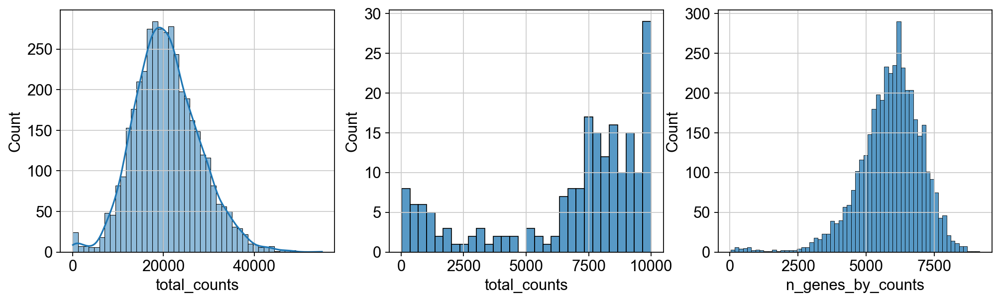

In [ ]:
# Aquí debo tenerlo presente para aprender a graficar

# Aquí creamos un gráfico de 1 fila con 3 columnas, 
fig, axs =plt.subplots(1,3, figsize=(15,4))

# Histograma de "total_counts" (número de reads por cada spot)
sns.histplot(adata.obs["total_counts"], kde=True, ax=axs[0])

# En el tutorial hacen un filtrado para spots con menos de 10000 counts, pero en mi opinión en este caso sería malo porque tenemos una distribución normal, pero sería algo así
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=30, ax=axs[1],)

# Histograma de genes por spot
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])

# Se puede también hacer el filtrado para genes 

In [20]:
# Antes de la normalización hacemos un filtrado de spots con pocas o muchas lecturas para evitar outlayers y spots vacíos, en el caso de trabajar con células individuales el filtro de mmuchas lecturas puede ayudar a reducir los dobletes.

sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)

# Sports con muchas lecturar mitocondriales podría indicar células dañadas o estresadas, por eso se filtran
adata = adata[adata.obs["pct_counts_mt"] <20].copy()

# Tambien se filtran genes que no estén representados en varios spots, en el tutorial usan genes presentes en mínimo 10 spots, estos genes raros podrían introducir ruido
sc.pp.filter_genes(adata, min_cells=10)

In [21]:
# Ahora debemos normalizar para que todos los spots tengan las mimas lecturas y poderlos comparar
sc.pp.normalize_total(adata, inplace=True)

# Luego se aplica una transformación logarítmica para estabilizar la varianza de los genes de alta y baja expresión
sc.pp.log1p(adata)

# Finalmente se estiman los 2000 genes más altamente variables y se marcan en una nueva columna
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [ ]:
# Hacemos un análisis de componentes principales para reducir las dimensiones del análisis y posteriormente agrupar

# PCA
sc.pp.pca(adata)

# Se calculan los vecinos más cercanos
sc.pp.neighbors(adata)

# Se hace el UMAP para calcular la representación en 2D de los spots manteniendo el análisis de vecino más cercano
sc.tl.umap(adata)

# Se aplica un algoritmo para encontrar los clusters de spots similares en expresión, es decir, algunos spots podrían estar fisicamente lejanos pero tener una expresión similar
sc.tl.leiden(adata, key_added="cluster", flavor="igraph", directed=False, n_iterations=2);

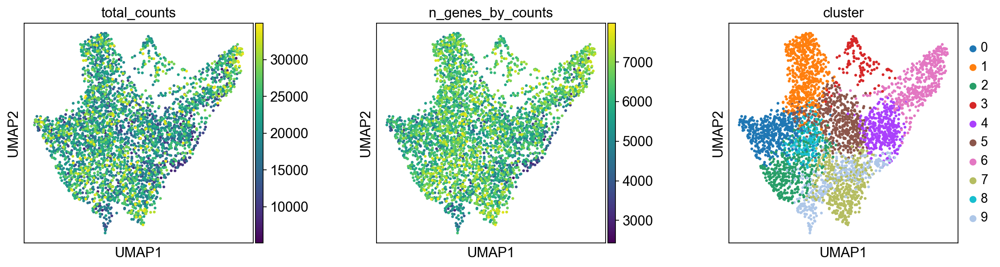

In [28]:
# Graficamos los UMAP
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "cluster"], wspace=0.4)

In [27]:
# Lista todas las columnas de adata.obs
adata.obs.columns


Index(['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts',
       'cluster'],
      dtype='object')

C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\961727417.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])


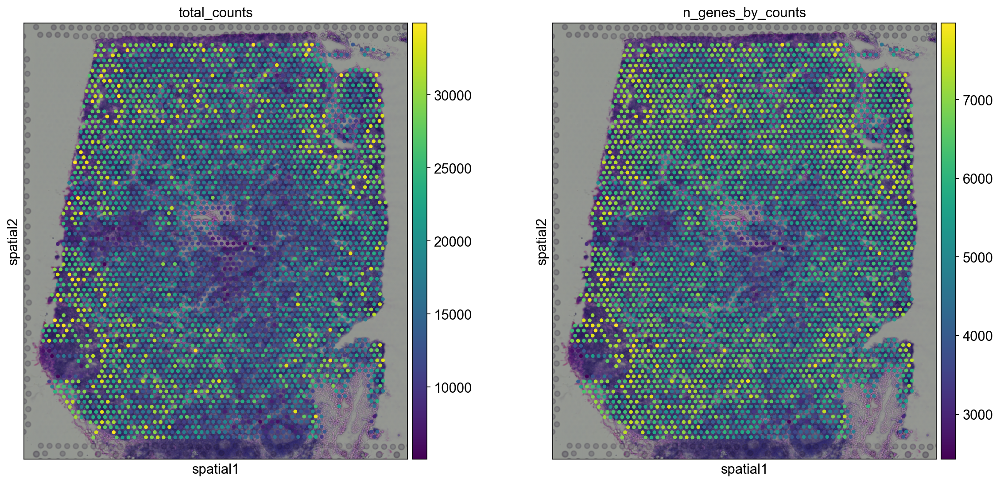

In [ ]:
# Ahora podemos ver los conteos y el número de genes en un contexto espacial
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\3074507322.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color="cluster", size=1.5)


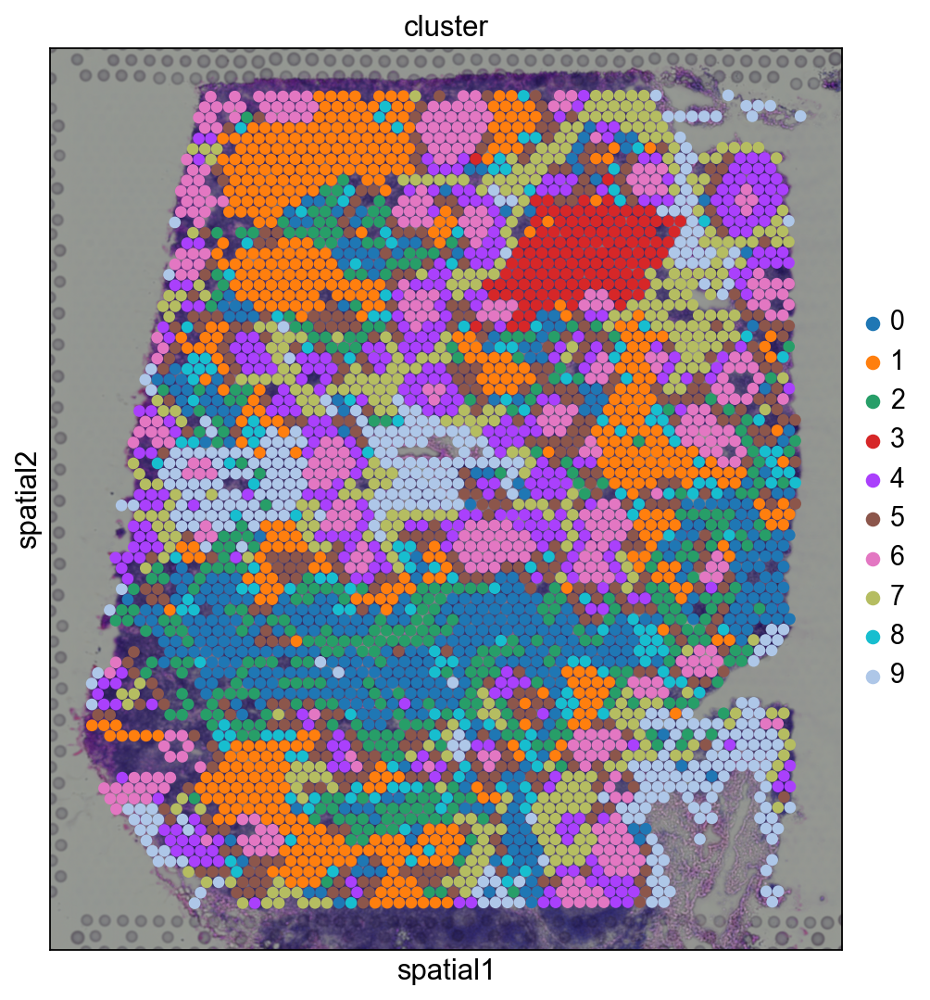

In [ ]:
# También podemos ver los clusters en este conexto, a simple viste algunos cluster parecen coexistir. Por mi parte aún desconozco mucha parte de cómo funcionan estos tejidos y es poco lo que puedo decir o intuír sobre esto.
sc.pl.spatial(adata, img_key="hires", color="cluster", size=1.5)


#Los clusters 4, 5 y 6 paracen coexistir en el espacio, al igual que los clusters 0, 1 y 2.

C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\3900078113.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\3900078113.py:18: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


[<Axes: title={'center': 'cluster'}, xlabel='spatial1', ylabel='spatial2'>]

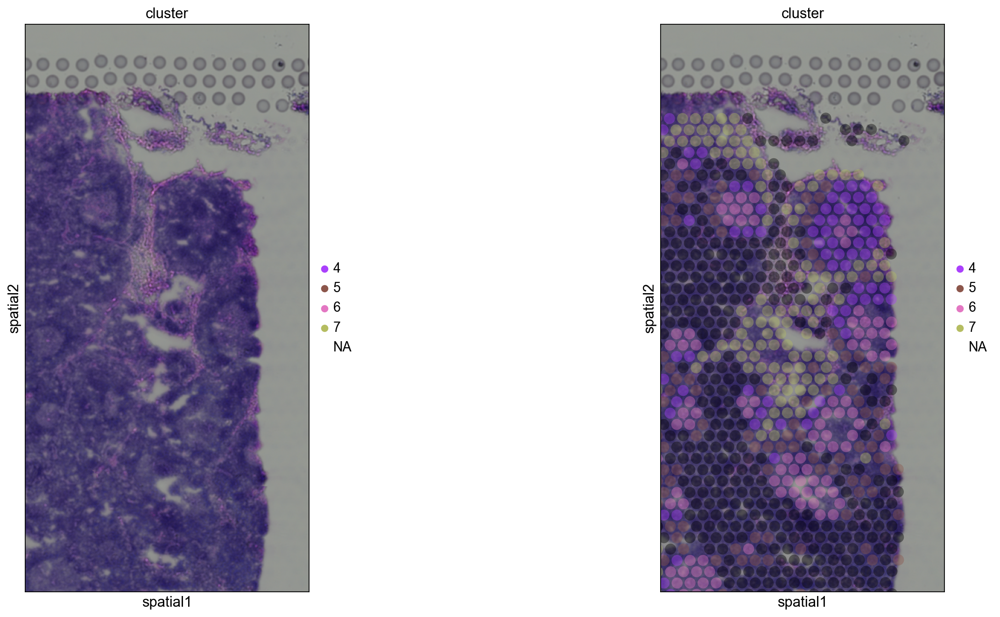

In [46]:
# Si es de interés podemos observar con más detalle algunas zonas, opacando los colores de los clusters u ocultándolos para ver mejor la morfología del tejido, aunque en mi opinión es mejor comparar 2 gráficos para ver en uno la morfología y en el otro los clusters
fig, axs = plt.subplots(1, 2, figsize=(20, 10))  # 1 fila, 2 columnas

# Primer subplot: alpha=0.2
sc.pl.spatial(
    adata,
    img_key="hires",
    color="cluster",
    groups=["4", "5", "6", "7"],
    crop_coord=[7000, 10000, 0, 6000],
    alpha=0,
    size=1.3,
    ax=axs[0],   # dibuja en el primer eje
    show=False   # no mostrar aún
)

# Segundo subplot: alpha=1.0
sc.pl.spatial(
    adata,
    img_key="hires",
    color="cluster",
    groups=["4", "5", "6", "7"],
    crop_coord=[7000, 10000, 0, 6000],
    alpha=0.4,
    size=1.3,
    ax=axs[1],   # dibuja en el segundo eje
    show=False
)



Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 0, 1, 2, etc.
var_group_labels: 6


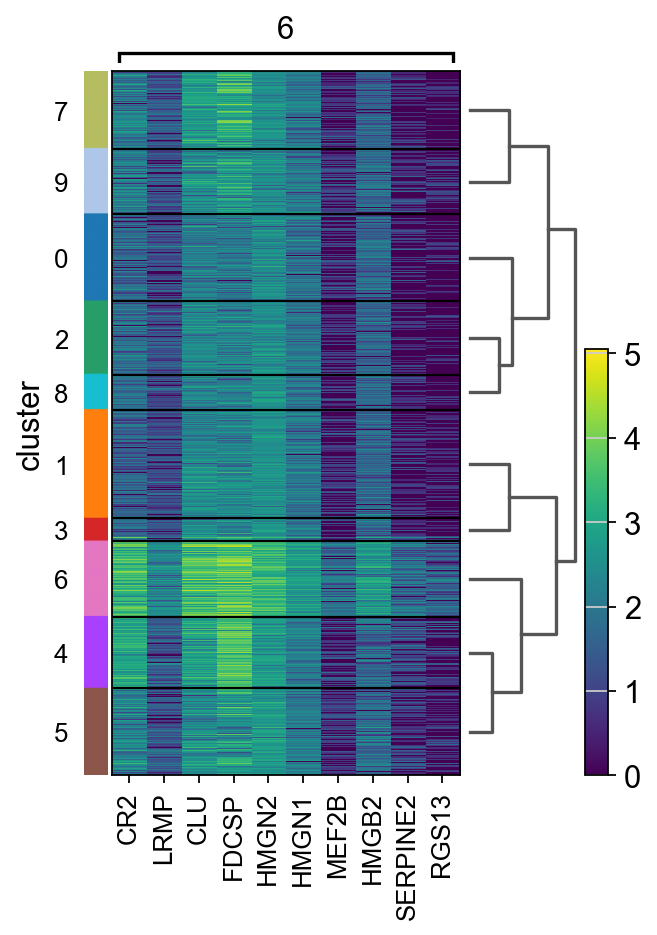

In [ ]:
# Tambien podemos analizar los genes marcadores de cada grupo, aquí vemos los 10 principales genes marcadores del cluster 6
sc.tl.rank_genes_groups(adata, "cluster", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="6", n_genes=10, groupby="cluster")

C:\Users\jupas\AppData\Local\Temp\ipykernel_17872\492983299.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["cluster", "CR2"])


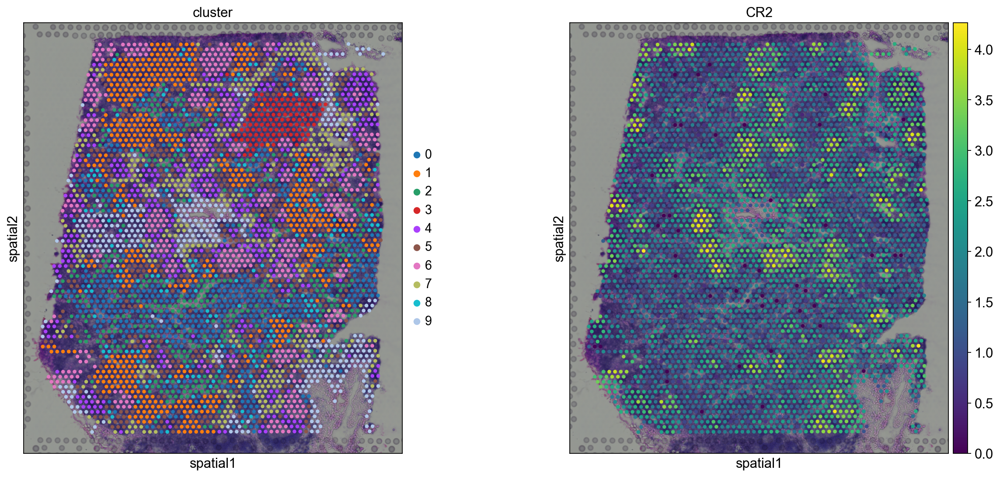

In [54]:
# Luego, podemos ver la expresión de cada uno de estos genes en el contexto espacial de la muestra del tejido
sc.pl.spatial(adata, img_key="hires", color=["cluster", "CR2"])

In [74]:
# Existen otras tecnologías, por ejemplo, en MERFISH se detectan moléculas de ARN de manera individual en el tejido con las coordenadas exactas, luego se pueden reconstruír las células

# Para este ejemplo debemos importar 2 archivos, el de coordenadas y el de conteos
coordinates = pd.read_excel("./data/pnas.1912459116.sd15.xlsx", index_col=0)
counts = sc.read_csv("./data/pnas.1912459116.sd12.csv").transpose()

In [75]:
# Ahora creamos el Anndata que va a contener los conteos de las celulas y sus coordenadas espaciales
adata_merfish = counts[coordinates.index, :].copy()
adata_merfish.obsm["spatial"] = coordinates.to_numpy()

In [ ]:
# Aquí repetimos el preprocesamiento de normalización etc y el análisis para reducir las dimensiones, hacer el UMAP y generar los cluster
sc.pp.normalize_per_cell(adata_merfish, counts_per_cell_after=1e6)
sc.pp.log1p(adata_merfish)
sc.pp.pca(adata_merfish, n_comps=15)
sc.pp.neighbors(adata_merfish)
sc.tl.umap(adata_merfish)
sc.tl.leiden(
    adata_merfish,
    key_added="clusters",
    resolution=0.5,
    n_iterations=2,
    flavor="igraph",
    directed=False,
);

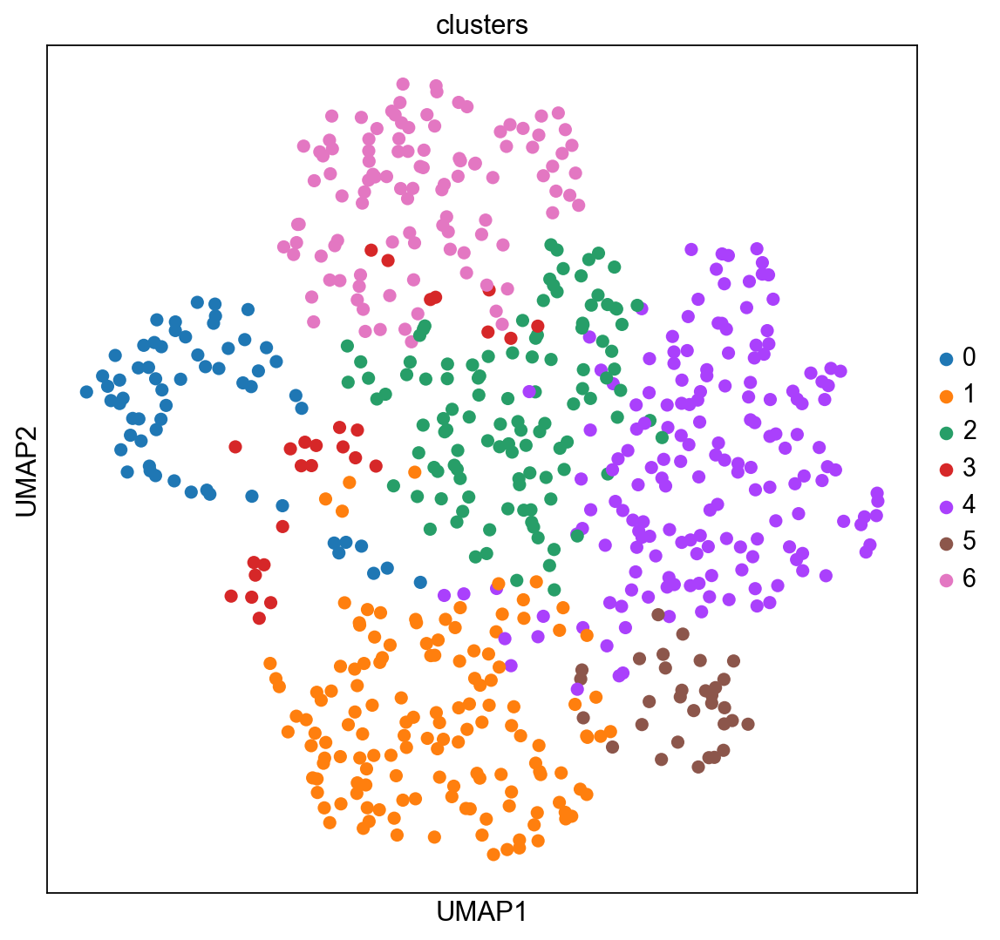

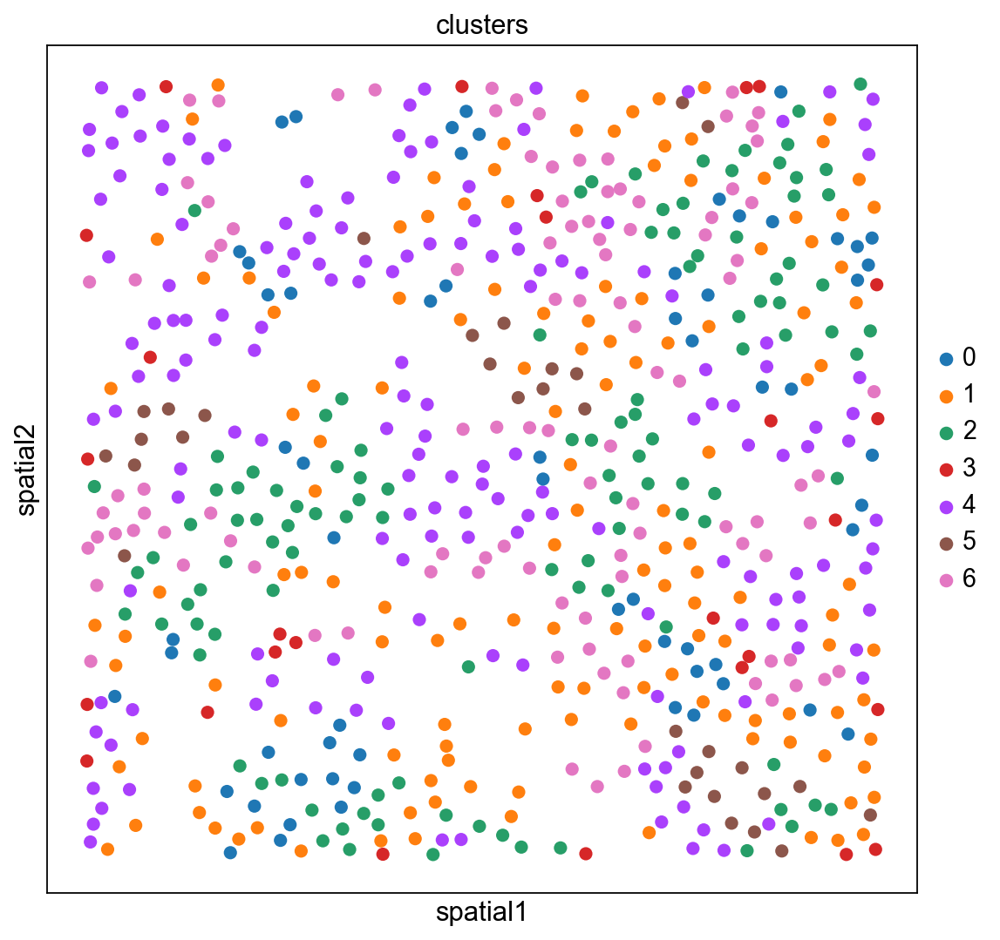

In [79]:
#Finalmente podemos:

# Visualizar el UMAP
sc.pl.umap(adata_merfish, color="clusters")

# Ver la distribución espacial de los clusters en el tejido, en este caso no tenemos la foto del tejido porque no la proporcionan en el tutorial, pero supongo que se podría hacer una superposición similar a la otra metdología
sc.pl.embedding(adata_merfish, basis="spatial", color="clusters")


Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 0, 1, 2, etc.
var_group_labels: 5


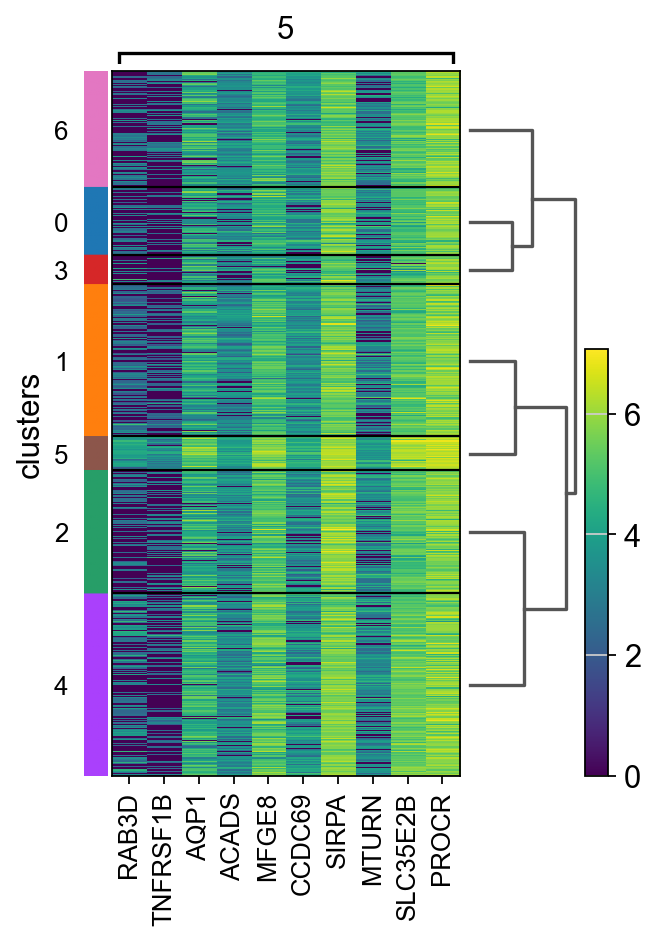

In [84]:
# Buscar genes marcadores por cluster usando t-test
sc.tl.rank_genes_groups(adata_merfish, groupby="clusters", method="t-test")

# Graficar un heatmap de los top 10 genes para un cluster específico
sc.pl.rank_genes_groups_heatmap(
    adata_merfish,
    groups="5",
    n_genes=10,
    groupby="clusters",
    cmap="viridis"
)


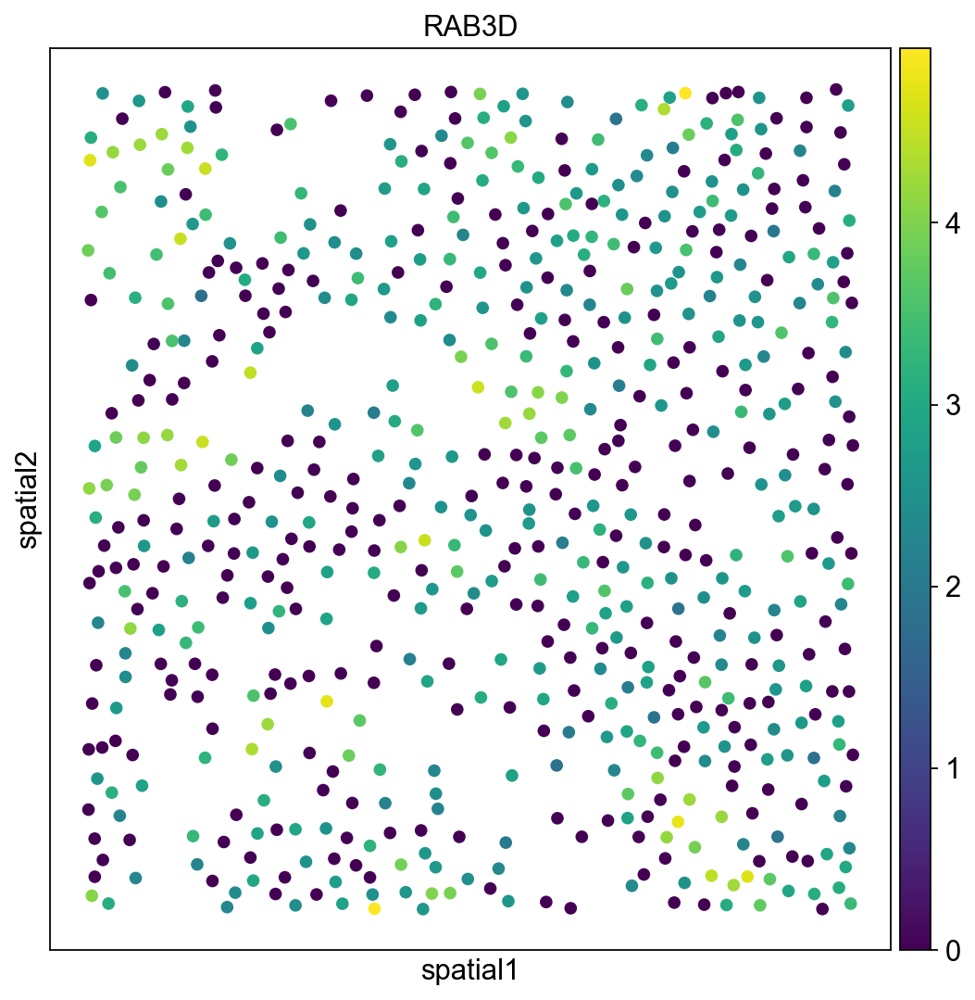

In [89]:
sc.pl.embedding(
    adata_merfish,
    basis="spatial",
    color="RAB3D",   # o el gen que quieras ver
    cmap="viridis",
    size=150
)


In [ ]:
# Profesor, sobre este segúndo método me quedan más dudas que respuestas, espero que sea de su agrado mi análisis del tutorial. Me siento listo para explorar los datos que usted me comentó, saludos.